In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
#import plotly.graph_objects as go
import folium
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap
#from matplotlib.sankey import Sankey
import utm 
import os
import requests
import json

#import pyarrow


In [2]:
folder_path = os.path.join(os.getcwd(), "data", "Subway_Capacities.xlsx")
#file_names = os.listdir(folder_path)
subway= pd.read_excel(folder_path)



In [3]:
subway.head()
#print(len(subway))


,Station,Lat,Long,Footfall
0,Far Rockaway-Mott Av,40.603995,-73.755405,10118.5748
1,Beach 25th St,40.600066,-73.761353,5846.7638
2,Beach 36th St,40.595398,-73.768175,5846.7638
3,Beach 44th St,40.592943,-73.776013,5846.7638
4,Jamaica-179th St,40.712646,-73.783817,11237.5827


In [4]:
#%run data_preparation.ipynb
%run functions.ipynb

folder_path = os.path.join(os.getcwd(), "data", "2019")
# List all files in the folder
file_names = os.listdir(folder_path)
# Initialize an empty list to store DataFrame chunks
chunks = []
# Loop through each file, load it, and append it to the list
for file_name in file_names:
    if file_name.endswith(".pkl.gz"):
        file_path = os.path.join(folder_path, file_name)
        chunk = pd.read_pickle(file_path, compression='gzip')
        chunks.append(chunk)

# Concatenate all DataFrame chunks into a single DataFrame
data_2019 = pd.concat(chunks, ignore_index=True)

print("Accessible dataframes    Description                            # of columns  ")
print("data_2019                Gives data for 2019-Baseline           15")


Accessible dataframes    Description                            # of columns  
data_2019                Gives data for 2019-Baseline           15


In [5]:
#data_2019.head()
#cd = data_2019.iloc[0:2000000]
print(len(data_2019))
April=data_2019[(data_2019['starttime'].dt.month == 4)]
print(len(April))

#cd=cd[(cd['starttime'].dt.date == Target)]
#cd = April.iloc[0:500000]
#cd.tail()

cd = data_2019
print(len(cd))

20551697
1766094
20551697


In [6]:

s_stat = data_2019.iloc[:,3:7].drop_duplicates().rename(columns={'start station id': "ID", 'start station name': "Name", 'start station latitude': "Latitude", 'start station longitude': "Longitude"})
e_stat = data_2019.iloc[:,7:11].drop_duplicates().rename(columns={'end station id': "ID", 'end station name': "Name", 'end station latitude': "Latitude", 'end station longitude': "Longitude"})
stations = pd.concat([s_stat,e_stat]).drop_duplicates()
stations = stations[stations['Latitude'] != 0]
print(len(stations))
stations.tail()

1107


,ID,Name,Latitude,Longitude
17111921,3272.0,Jersey & 3rd,40.723332,-74.045953
17190239,3273.0,Manila & 1st,40.721651,-74.042884
19032094,3187.0,Warren St,40.721124,-74.038051
20208636,212.0,W 16 St & The High Line,40.743000,-74.007000
20548266,3062.0,Myrtle Ave & Marcy Ave,40.695000,-73.950000


In [7]:
cd.dtypes


tripduration                        int64
starttime                  datetime64[ns]
stoptime                   datetime64[ns]
start station id                  float64
start station name               category
start station latitude            float64
start station longitude           float64
end station id                    float64
end station name                 category
end station latitude              float64
end station longitude             float64
bikeid                           category
usertype                         category
birth year                          int64
gender                           category
dtype: object

In [8]:

test = cd[(cd['starttime'].dt.hour == 8) & (cd['gender'] == 1 )]
test.head()
print(len(test))
print(len(cd))

1156086
20551697


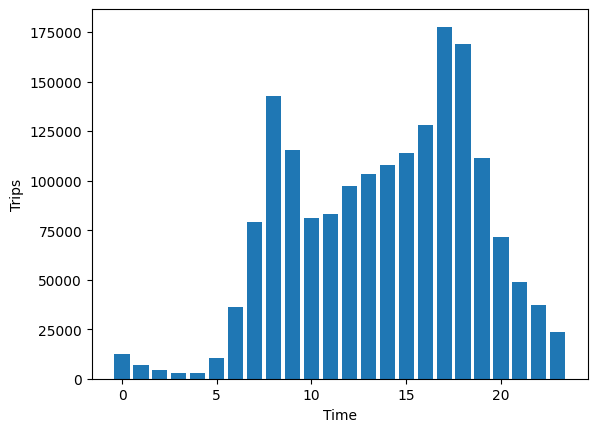

In [12]:
#hours = cd['Start Time'].str[11:13].to_list()
#hours_uq = sorted(set(hours))
hours_uq = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]

hours_count = []
for t in hours_uq:
    test = cd[cd['starttime'].dt.hour == t]
    hours_count.append(len(test))


plt.bar(hours_uq, hours_count)
plt.xlabel('Time')
plt.ylabel('Trips')
#plt.xticks(hours_uq, [f"{hour:02d}:00" for hour in hours_uq])
plt.show()

In [29]:
test = cd[cd['starttime'].dt.month == 12]
print(len(test))

955210


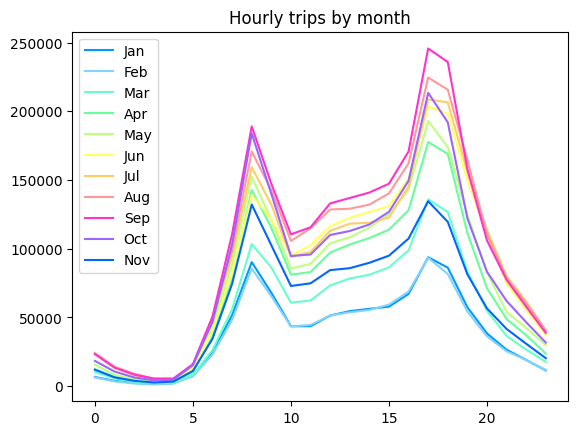

In [15]:
#months = [1,2,3,4,5,6,7,8,9,10,11,12]
#months_name = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct','Nov', 'Dec']
#hours_uq = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
#colors = ['#0099ff','#80d4ff','#66ffcc','#66ff99','#bfff80','#ffff66','#ffcc66','#ff9999','#ff33cc','#9966ff','#0066ff']

#plt.title('Hourly trips by month')
#for m, color in zip(months, colors):
 #   hours_count = []
  #  for t in hours_uq:  
   #     test = cd[(cd['starttime'].dt.hour == t) & (cd['starttime'].dt.month == m)]
    #    hours_count.append(len(test))
#    plt.plot(hours_uq, hours_count, label=months_name[m - 1], c=color)  # Using m - 1 to access months_name
#plt.legend()
#plt.show()

In [16]:
# Create a dictionary to store hourly trip counts for each month
months = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
hours_uq = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
months_name = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct','Nov', 'Dec']
monthly_data = {}

for month in months:
    hours_count = []
    for hour in hours_uq:
        trips_in_hour = cd[(cd['starttime'].dt.hour == hour) & (cd['starttime'].dt.month == month)]
        hours_count.append(len(trips_in_hour))
    monthly_data[month] = hours_count

C:\Users\sophi\AppData\Local\Temp\ipykernel_19136\3945683571.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')


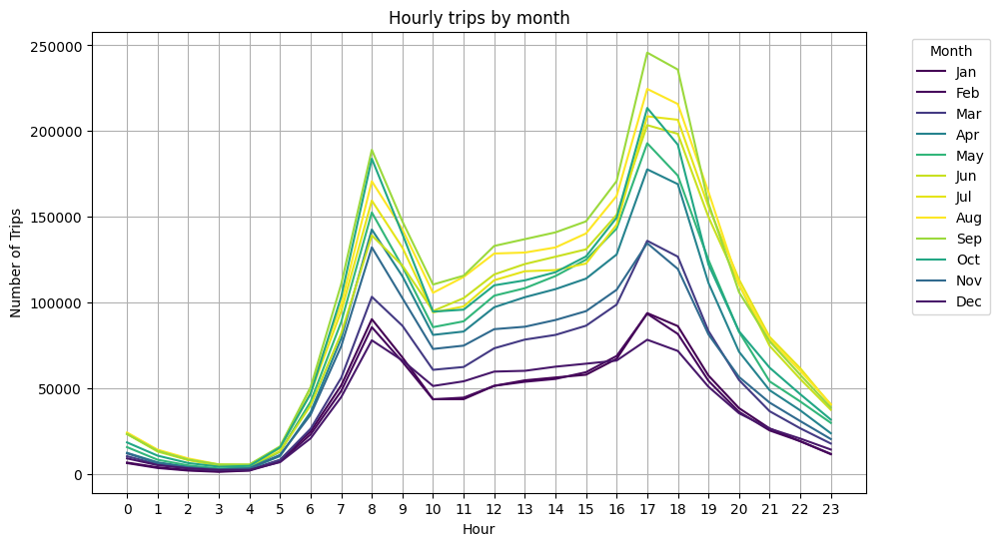

In [26]:
#colors = ['#0099ff','#80d4ff','#66ffcc','#66ff99','#bfff80','#ffff66','#ffcc66','#ff9999','#ff33cc','#9966ff','#5c00e6','#0000b3']

values = [0.5, 1 , 4.5, 11, 16, 22, 23, 24 , 20.5, 14.5 , 8.5, 2]
cmap = plt.cm.get_cmap('viridis')
# Normalize the values to range [0, 1]
norm = plt.Normalize(min(values), max(values))
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Dummy array required for ScalarMappable
colors = [sm.to_rgba(value) for value in values]


plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.title('Hourly trips by month')

for i, month in enumerate(monthly_data.keys()):
    plt.plot(hours_uq, monthly_data[month], label=months_name[i], color=colors[i])

plt.xlabel('Hour')
plt.ylabel('Number of Trips')
plt.xticks(hours_uq)
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

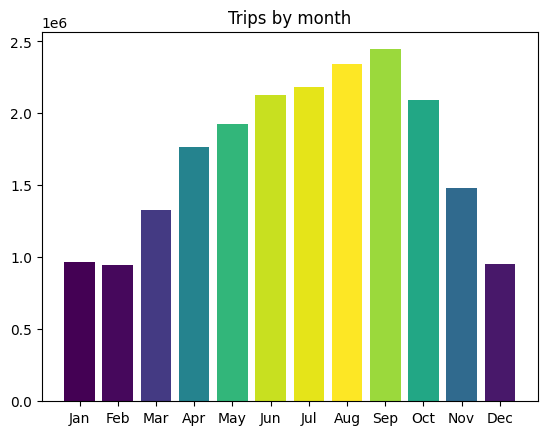

In [29]:

plt.title('Trips by month')

month_count=[]
for m in months:  
        test = cd[ (cd['starttime'].dt.month == m) ]
        month_count.append(len(test))
plt.bar(months_name, month_count, color=colors)
plt.show()

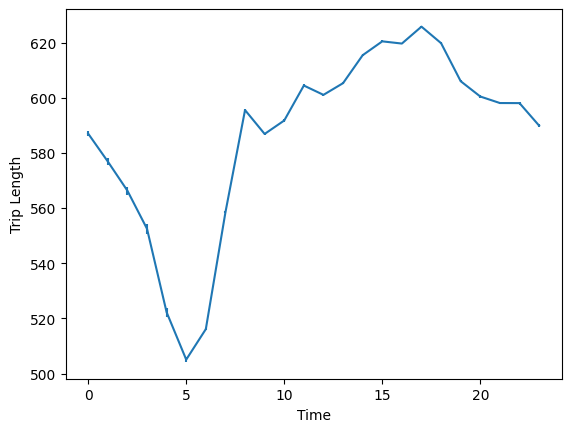

In [36]:
cd1=cd[cd['tripduration']<1440]
trip_duration= []
trip_error = []

for t in hours_uq:
    test = cd1[(cd1['starttime'].dt.hour == t)]
    x = test['tripduration'].mean()
    trip_duration.append(x)
    std_err = test['tripduration'].std() / np.sqrt(len( test['tripduration']))
    trip_error.append(std_err)


plt.errorbar(hours_uq, trip_duration, yerr=trip_error)
plt.xlabel('Time')
plt.ylabel('Trip Length')
plt.show()

In [31]:
station_start_count = []
station_end_count = []
for station_name in stations['Name']:
    #station_name_with_tab = station_name + '\t'
    #station_name_cleaned = station_name_with_tab.strip()  # Remove leading and trailing whitespace
    #print(f"Checking station name: '{station_name_cleaned}'")
    #s_count = cd['start station name'].value_counts().get(station_name_cleaned, 0)
    #e_count = cd['end station name'].value_counts().get(station_name_cleaned, 0)
    
    s_count = len(cd[cd['start station name']== station_name])
    e_count = len(cd[cd['end station name'] == station_name])
    station_start_count.append(s_count)
    station_end_count.append(e_count)


print(station_start_count)
print(station_end_count)

stations['Start Count'] = station_start_count
stations['End Count'] = station_end_count

[35325, 156575, 32186, 82553, 76523, 14087, 7556, 113012, 3082, 70956, 86406, 66029, 11767, 14191, 65043, 7753, 30712, 60369, 53619, 40005, 12724, 110305, 44337, 4705, 12600, 53926, 47620, 27411, 56137, 13441, 9497, 21546, 24915, 62951, 41758, 79865, 41412, 58476, 3843, 27174, 40922, 16476, 23340, 40046, 30313, 56925, 47546, 16743, 69098, 36561, 30089, 59441, 39229, 113138, 46017, 48395, 13932, 64229, 19056, 21160, 61365, 62665, 16572, 47886, 43709, 56314, 11779, 61517, 51176, 17967, 64430, 44598, 53139, 4285, 18947, 42468, 63951, 46991, 16081, 11179, 55970, 26705, 81812, 41397, 3817, 52390, 28465, 25249, 121781, 25241, 6797, 32649, 55020, 67558, 34462, 101413, 7194, 25434, 49415, 41877, 46870, 32680, 67829, 5495, 70646, 35382, 10638, 17497, 105636, 9812, 26, 17098, 52124, 21822, 37322, 40517, 19479, 30631, 13717, 4487, 9272, 44029, 4700, 55802, 32785, 32952, 29084, 11806, 20197, 15196, 66802, 85076, 36863, 42431, 6945, 20594, 103167, 76525, 38243, 99300, 55584, 58984, 32118, 82200, 16

In [44]:


# Normalize 'Start Count' and 'End Count'
stations['start_w'] = stations['Start Count'] / stations['Start Count'].max()
stations['end_w'] = stations['End Count'] / stations['End Count'].max()

# Create a map centered around a specific latitude and longitude
mymap = folium.Map(location=[40.730610, -73.935242], zoom_start=12)

# Add markers for each station
for idx, station in stations.iterrows():
    folium.CircleMarker(location=[station['Latitude'], station['Longitude']],
                        radius=25*station['start_w'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity=0.5, #station['start_w'],  # Using 'Start Count' for opacity
                        fill_color='blue',  # Marker color without outline
                        color=None,  # Remove the marker outline
                        ).add_to(mymap)
    
    folium.CircleMarker(location=[station['Latitude'], station['Longitude']],
                        radius=25*station['end_w'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity=0.5, #station['end_w'],  # Using 'End Count' for opacity
                        fill_color='red',  # Marker color without outline
                        color=None,  # Remove the marker outline
                        ).add_to(mymap)

# Display the map
mymap

In [33]:
cd = April

In [34]:
station_start_count = []
station_end_count = []
for station_name in stations['Name']:
    s_count = len(cd[(cd['start station name'] == station_name) & (cd['starttime'].dt.hour >=7) & (cd['starttime'].dt.hour <=9)] )
    station_start_count.append(s_count)
    e_count = len(cd[(cd['end station name'] == station_name) & (cd['starttime'].dt.hour >=7) & (cd['starttime'].dt.hour <=9)])
    station_end_count.append(e_count)
stations['Start Count'] = station_start_count
stations['End Count'] = station_end_count

stations = stations[stations['Latitude'] != 0]
stations['start_w'] = stations['Start Count'] / stations['Start Count'].max()
stations['end_w'] = stations['End Count'] / stations['End Count'].max()
mymap = folium.Map(location=[40.730610, -73.935242], zoom_start=12)

for idx, station in stations.iterrows():
    folium.CircleMarker(location=[station['Latitude'], station['Longitude']],
                        radius=25*station['start_w'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity=0.5, # station['start_w'],  # Using 'Start Count' for opacity
                        fill_color='blue',  # Marker color without outline
                        color=None,  # Remove the marker outline
                        ).add_to(mymap)
    
    folium.CircleMarker(location=[station['Latitude'], station['Longitude']],
                        radius=25*station['end_w'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity= 0.5 , #station['end_w'],  # Using 'End Count' for opacity
                        fill_color='red',  # Marker color without outline
                        color=None,  # Remove the marker outline
                        ).add_to(mymap)

# Display the map
mymap

In [36]:
for idx, station in stations.iterrows():
    folium.CircleMarker(location=[station['Latitude'], station['Longitude']],
                        radius=10*station['start_w'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity=0.1+0.5*station['start_w'],  # Using 'Start Count' for opacity
                        fill_color='blue',  # Marker color without outline
                        color=None,  # Remove the marker outline
                        ).add_to(mymap)
    
    folium.CircleMarker(location=[station['Latitude'], station['Longitude']],
                        radius=10*station['end_w'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity= 0.2+ 0.5*station['end_w'],  # Using 'End Count' for opacity
                        fill_color='red',  # Marker color without outline
                        color=None,  # Remove the marker outline
                        ).add_to(mymap)

# Display the map
mymap

In [49]:
station_start_count = []
station_end_count = []
for station_name in stations['Name']:
    s_count = len(cd[(cd['start station name'] == station_name) & (cd['starttime'].dt.hour >=17) & (cd['starttime'].dt.hour <=19)] )
    station_start_count.append(s_count)
    e_count = len(cd[(cd['end station name'] == station_name) & (cd['starttime'].dt.hour >=17) & (cd['starttime'].dt.hour <=19)])
    station_end_count.append(e_count)
stations['Start Count'] = station_start_count
stations['End Count'] = station_end_count




stations = stations[stations['Latitude'] != 0]
stations['start_w'] = stations['Start Count'] / stations['Start Count'].max()
stations['end_w'] = stations['End Count'] / stations['End Count'].max()
mymap = folium.Map(location=[40.730610, -73.935242], zoom_start=12)

for idx, station in stations.iterrows():
    folium.CircleMarker(location=[station['Latitude'], station['Longitude']],
                        radius=25*station['start_w'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity = 0.5, #station['start_w'],  # Using 'Start Count' for opacity
                        fill_color='blue',  # Marker color without outline
                        color=None,  # Remove the marker outline
                        ).add_to(mymap)
    
    folium.CircleMarker(location=[station['Latitude'], station['Longitude']],
                        radius=25*station['end_w'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity= 0.5,#station['end_w'],  # Using 'End Count' for opacity
                        fill_color='red',  # Marker color without outline
                        color=None,  # Remove the marker outline
                        ).add_to(mymap)

# Display the map
mymap

In [40]:
#worse than the above plots size as total usage (arrival / exit) and colour maps flow ( leaving or arriving)
#cd = April.iloc[0:500000]


: 

In [39]:



subway['weight'] = subway['Footfall']/ subway['Footfall'].max()

mymap = folium.Map(location=[40.730610, -73.935242], zoom_start=12)


for idx, station in subway.iterrows():
    location = (station['Lat'], station['Long'])  # Create a tuple with latitude and longitude
    folium.CircleMarker(location=location,
                        radius=15* station['weight'],  # Adjust the size of each marker
                        fill=True,
                        fill_opacity= station['weight'],
                        fill_color='blue',
                        color=None,
                        ).add_to(mymap)

# Display the map
mymap

In [17]:
#    source = []
#    target = []
#    for s in range(len(largestationlist)):
#        for t in range(len(largestationlist)):
#        source.append(largestationlist[s])
#        target.append(largestationlist[t])
#
 #   value = []
 #   for i in range(len(largestationlist)):
  #      start = source[i]
#        end = target[i]
#        v = len(cd[(cd['Start Station Name'] == start) & (cd['End Station Name'] == end)])
#        value.append(v)
#    print(value)

#    link = dict(source = source, target = target, value = value)
#    data = go.Sankey(link = link)

 #   fig = go.Figure(data)
  #  fig.show()



In [23]:
def plot_flow(cd,time1,time2):
    s_stat = cd.iloc[:,3:7].drop_duplicates().rename(columns={'start station id': "ID", 'start station name': "Name", 'start station latitude': "Latitude", 'start station longitude': "Longitude"})
    e_stat = cd.iloc[:,7:11].drop_duplicates().rename(columns={'end station id': "ID", 'end station name': "Name", 'end station latitude': "Latitude", 'end station longitude': "Longitude"})
    stations = pd.concat([s_stat,e_stat]).drop_duplicates()
    stations = stations[stations['Latitude'] != 0]

    station_start_count, station_end_count = [], []
    for station_name in stations['Name']:
        s_count = len(cd[(cd['start station name'] == station_name) & (cd['starttime'].dt.hour >=time1) & (cd['starttime'].dt.hour <=time2)] )
        station_start_count.append(s_count)
        e_count = len(cd[(cd['end station name'] == station_name) & (cd['starttime'].dt.hour >=time1) & (cd['starttime'].dt.hour <=time2)])
        station_end_count.append(e_count)
    stations['Start Count'] = station_start_count
    stations['End Count'] = station_end_count

    stations['start_w'] = stations['Start Count'] / stations['Start Count'].max()
    stations['end_w'] = stations['End Count'] / stations['End Count'].max()
    mymap = folium.Map(location=[40.730610, -73.935242], zoom_start=12)

    for idx, station in stations.iterrows():
        folium.CircleMarker(location=[station['Latitude'], station['Longitude']], radius=25*station['start_w'], fill=True, fill_opacity = station['start_w'], fill_color='blue',color=None,
                            ).add_to(mymap)
        
        folium.CircleMarker(location=[station['Latitude'], station['Longitude']], radius=25*station['end_w'], fill=True, fill_opacity= station['end_w'], fill_color='red', color=None,  
                            ).add_to(mymap)
    return mymap

In [22]:
plot_flow(cd, 7, 9)

In [50]:
cd.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender
0,1639,2019-07-18 11:44:47.110,2019-07-18 12:12:06.530,3143.0,5 Ave & E 78 St,40.776321,-73.964274,3165.0,Central Park West & W 72 St,40.775794,-73.976206,39809,Customer,1969,0
1,580,2019-07-18 11:44:47.252,2019-07-18 11:54:27.697,391.0,Clark St & Henry St,40.697601,-73.993446,3389.0,Carroll St & Columbia St,40.683046,-74.003486,27162,Subscriber,1964,1
2,618,2019-07-18 11:44:48.559,2019-07-18 11:55:06.787,3491.0,E 118 St & 1 Ave,40.797470,-73.935040,3534.0,Frederick Douglass Blvd & W 117 St,40.805159,-73.954692,38927,Subscriber,1978,1
3,616,2019-07-18 11:44:51.113,2019-07-18 11:55:07.747,3491.0,E 118 St & 1 Ave,40.797470,-73.935040,3534.0,Frederick Douglass Blvd & W 117 St,40.805159,-73.954692,39469,Subscriber,1992,1
4,438,2019-07-18 11:44:52.692,2019-07-18 11:52:11.643,489.0,10 Ave & W 28 St,40.750664,-74.001768,284.0,Greenwich Ave & 8 Ave,40.739017,-74.002638,26788,Subscriber,1983,2


In [51]:
cd2 = cd[cd['tripduration'] < 1000000].iloc[1:10000]
#time_intervals = [0, 60, 300, 600, 1200, 1800, 6000, 12000]

time_intervals = []
for i in range(31):
    x=i*60
    time_intervals.append(x)
#time_intervals.append(6000)

# Categorize 'Trip Duration' into time intervals
cd2['Time Interval'] = pd.cut(cd2['tripduration'], bins=time_intervals)
# Count the occurrences in each time interval
counts = cd2['Time Interval'].value_counts().sort_index()
#counts = pd.cut(cd2['Trip Duration'], bins=time_intervals).value_counts()

plt.bar(x=counts.index.astype(str), height=counts)
plt.xlabel('Journey Duration (Minutes)')
plt.ylabel('Count')
plt.title('Count of Trip Durations in Time Intervals')
plt.xticks(rotation=45)
plt.show()


: 